# League of Legends winner predictor

Multiplayer online battle arena featured in Esports. In the game, two teams of five players battle in player versus player combat, each team occupying and defending their half of the map. Each of the ten players controls a character, known as a "champion", with unique abilities and differing styles of play. During a match, champions become more powerful by collecting experience points, earning gold, and purchasing items to defeat the opposing team. In the game's main mode, Summoner's Rift, a team wins by pushing through to the enemy base and destroying their "Nexus", a large structure located within.

## Introduction
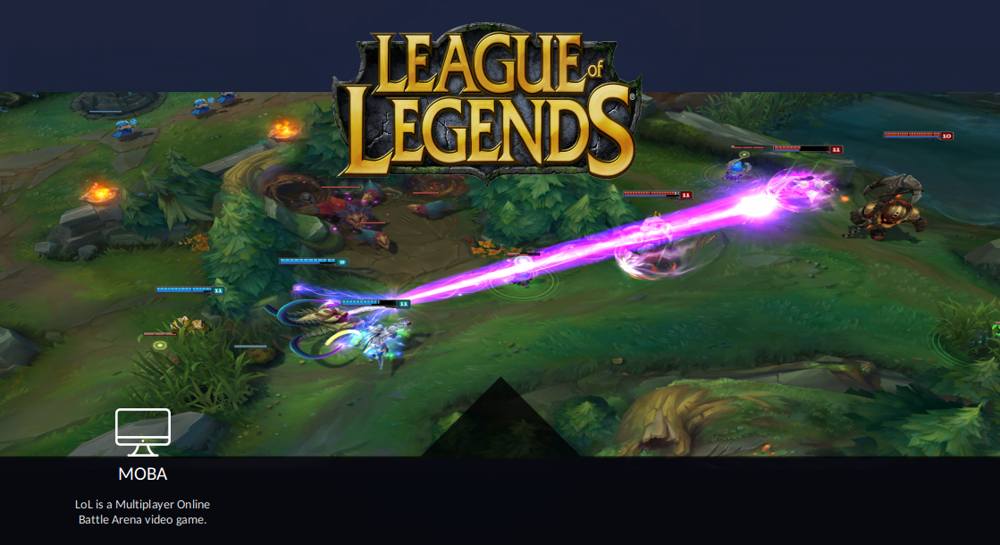

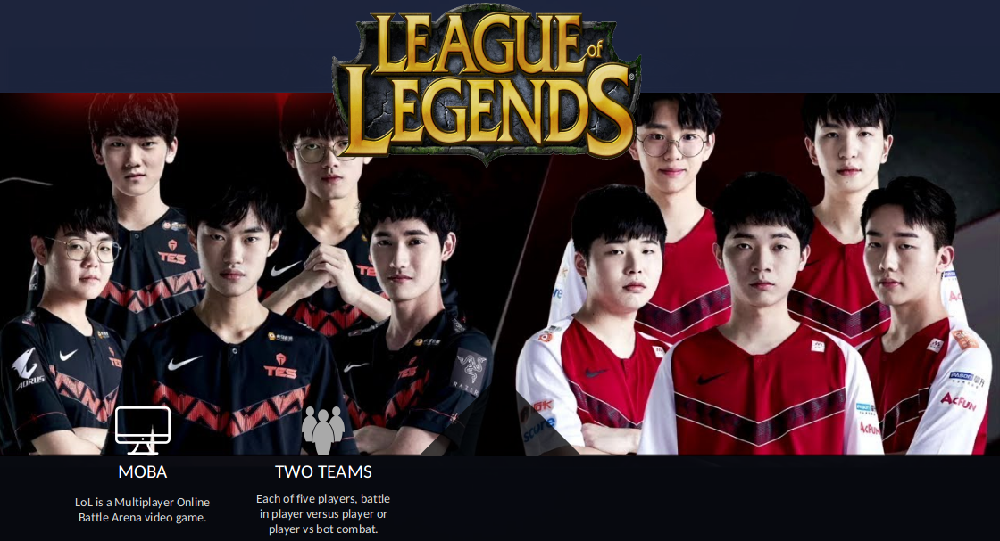

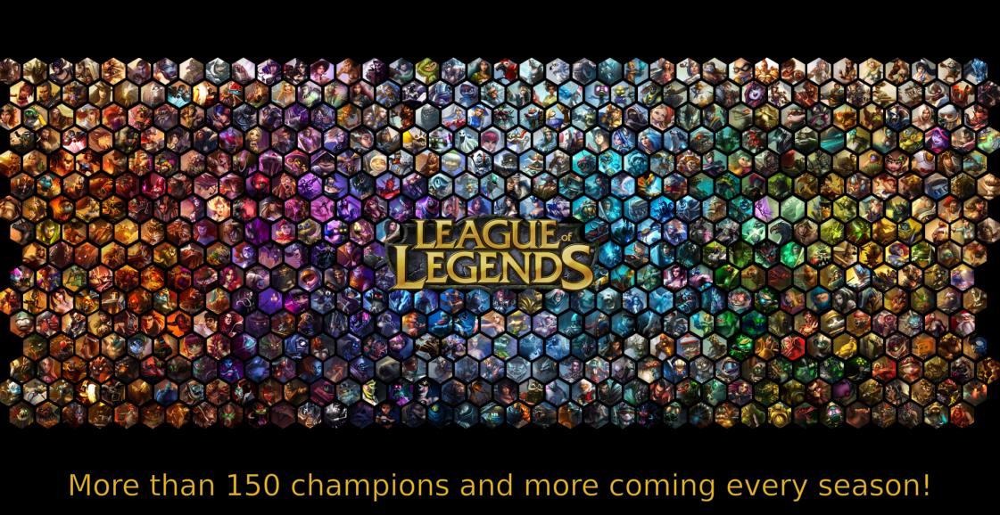

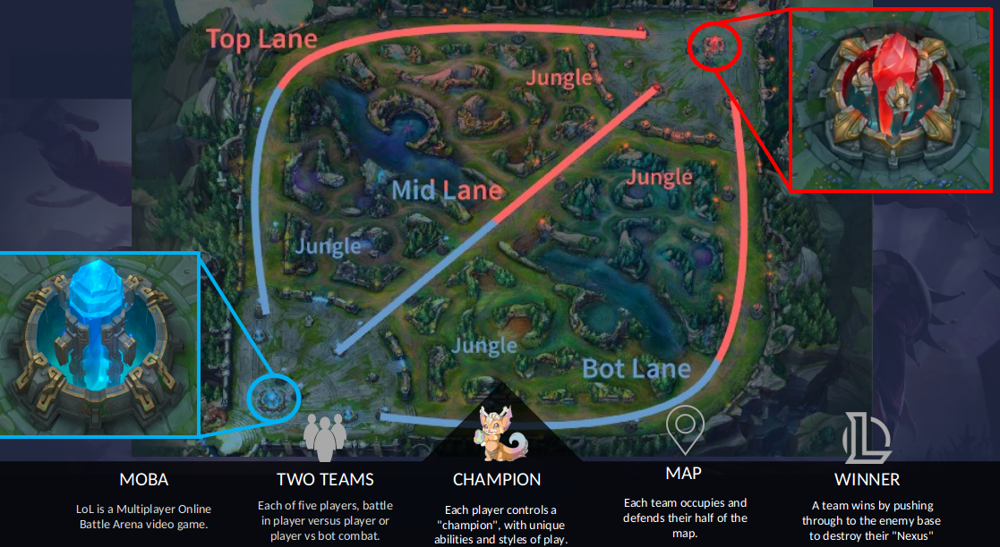

Multiplayer online battle arena featured in Esports. In the game, two teams of five players battle in player 
versus player combat, each team occupying and defending their half of the map. Each of the ten players controls a character, known as a "champion", with unique abilities and differing styles of play. During a match, champions become more powerful by collecting experience points, earning gold, and purchasing items to defeat the opposing team. In the game's main mode, Summoner's Rift, a team wins by pushing through to the enemy base and destroying their "Nexus", a large structure located within.

## Prepare the data

### Open the data

In [7]:
import numpy as np
import pandas as pd
import json

file = '../raw_data/full_dump.json'
with open(file) as data_file:    
    data = json.load(data_file) 
data

{'EU Challenger Series/2017 Season/Spring Qualifiers/Scoreboards_1_1': {'id': 'EU Challenger Series/2017 Season/Spring Qualifiers/Scoreboards_1_1',
  'start': None,
  'patch': '6.24',
  'winner': 'BLUE',
  'duration': 2023,
  'acs_teams': {},
  'picks_bans': [],
  'teams': {'BLUE': {'name': 'Fnatic Academy',
    'total_turret_kills': 11,
    'total_inhibitor_kills': 3,
    'total_rift_herald_kills': 0,
    'total_dragon_kills': 2,
    'total_baron_kills': 1,
    'side': 'BLUE',
    'players': [{'name': 'Kikis',
      'id': 172122,
      'role': 'TOP',
      'champion_name': 'Nautilus',
      'champion_id': 111,
      'gold_15': 5326,
      'kills_assists_15': 8,
      'deaths_15': 1,
      'total_gold': 12504,
      'total_cs': 233,
      'total_kills': 2,
      'total_monster_kills': 0,
      'total_assists': 6,
      'total_deaths': 1,
      'total_damage_taken': 18220,
      'total_damage_dealt': 156270,
      'win': True,
      'side': 'BLUE'},
     {'name': 'Broxah',
      'id': 1

In [24]:
import random 
data_keys = list(data.keys())
random.sample(data_keys, 5)

['UK League Championship/2019 Season/Spring Season/Tower 6/Scoreboards_5_1',
 'LMS/2016 Season/Summer Season/Scoreboards/Week 3_1_2',
 'PCS/2020 Season/Spring Season/Scoreboards/Week 6_12_1',
 'LMS/2016 Season/Spring Season/Scoreboards/Week 6_4_1',
 'EU Challenger Series/2017 Season/Spring Season/Scoreboards/Week 5_1_2']

In [22]:
f'input data: {len(data)}'

'input data: 35320'

### Normalize the data 

Normalize means to expand the nested keys in the JSON file and the subsequent DataFrame.

In [30]:
#Normalize the complete dataframe and make a copy
df_normalized_teams = pd.json_normalize(data.values())
df_teams = df_normalized_teams.copy()
df_teams.sample(2)

,id,start,patch,winner,duration,picks_bans,teams.BLUE.name,teams.BLUE.total_turret_kills,teams.BLUE.total_inhibitor_kills,teams.BLUE.total_rift_herald_kills,...,teams.BLUE.side,teams.BLUE.players,teams.RED.name,teams.RED.total_turret_kills,teams.RED.total_inhibitor_kills,teams.RED.total_rift_herald_kills,teams.RED.total_dragon_kills,teams.RED.total_baron_kills,teams.RED.side,teams.RED.players
6442,NA Academy League/2018 Season/Spring Playoffs/...,None,8.5,BLUE,2518,"[{'champion_name': 'Caitlyn', 'is_ban': True},...",Team Liquid Academy,11,5,1,...,BLUE,"[{'name': 'V1per', 'id': 219770, 'role': 'TOP'...",Echo Fox Academy,6,0,0,2,1,RED,"[{'name': 'Allorim', 'id': 189481, 'role': 'TO..."
34319,NA Challenger Series/2016 Season/Summer Playof...,None,6.13,BLUE,1846,[],Cloud9 Challenger,10,1,1,...,BLUE,"[{'name': 'BalIs', 'id': 191215, 'role': 'TOP'...",Dream Team,4,0,0,0,0,RED,"[{'name': 'AnDa', 'id': 124430, 'role': 'TOP',..."


In [31]:
def get_patch_year(s):
    return int(s.split('.')[0]) + 2010

#return the year the game was played
df_teams['year'] = df_teams.patch.apply(get_patch_year)
df_teams.year.sample(2)

8104     2018
19212    2020
Name: year, dtype: int64

In [26]:
#Make a dataframe dedicated to the team BLUE
df_normalized_teams['teams.BLUE.players'].explode()
df_normalized_BLUE = pd.json_normalize(df_normalized_teams['teams.BLUE.players'].explode())
df_BLUE = df_normalized_BLUE.copy()
df_BLUE.head(5)

,name,id,role,champion_name,champion_id,gold_15,kills_assists_15,deaths_15,total_gold,total_cs,total_kills,total_monster_kills,total_assists,total_deaths,total_damage_taken,total_damage_dealt,win,side
0,Kikis,172122.0,TOP,Nautilus,111,5326.0,8.0,1.0,12504,233,2,0,6,1,18220,156270,True,BLUE
1,Broxah,193072.0,JGL,Lee Sin,64,5261.0,11.0,1.0,12352,153,4,132,7,1,22212,152183,True,BLUE
2,Nisqy,185791.0,MID,Syndra,134,6009.0,13.0,1.0,13393,229,5,6,8,1,10647,177681,True,BLUE
3,MrRallez,183407.0,BOT,Jhin,202,5304.0,11.0,0.0,13969,315,2,5,9,0,9758,228328,True,BLUE
4,Klaj,171882.0,SUP,Karma,43,2767.0,12.0,0.0,9740,38,1,0,11,0,11917,34299,True,BLUE


In [27]:
#Make a dataframe dedicated to the team RED
df_normalized_teams['teams.RED.players'].explode()
df_normalized_RED = pd.json_normalize(df_normalized_teams['teams.RED.players'].explode())
df_RED = df_normalized_RED.copy()
df_RED.head(5)

,name,id,role,champion_name,champion_id,gold_15,kills_assists_15,deaths_15,total_gold,total_cs,total_kills,total_monster_kills,total_assists,total_deaths,total_damage_taken,total_damage_dealt,win,side
0,Phones,193289.0,TOP,Maokai,57,4528.0,2.0,7.0,9611,190,1,13,1,7,41065,111536,False,RED
1,Obvious,187241.0,JGL,Rengar,107,4728.0,2.0,1.0,9640,174,0,126,2,1,27879,147035,False,RED
2,MagiFelix,181359.0,MID,Ryze,13,4893.0,2.0,3.0,11840,301,0,2,2,3,16013,205899,False,RED
3,Sedrion,197437.0,BOT,Varus,110,5133.0,2.0,1.0,12010,283,2,1,0,1,10370,184927,False,RED
4,Noxiak,185879.0,SUP,Nami,267,2521.0,2.0,2.0,7348,16,0,0,2,2,13815,15418,False,RED


In [32]:
df_RED.head(5)

,name,id,role,champion_name,champion_id,gold_15,kills_assists_15,deaths_15,total_gold,total_cs,total_kills,total_monster_kills,total_assists,total_deaths,total_damage_taken,total_damage_dealt,win,side
0,Phones,193289.0,TOP,Maokai,57,4528.0,2.0,7.0,9611,190,1,13,1,7,41065,111536,False,RED
1,Obvious,187241.0,JGL,Rengar,107,4728.0,2.0,1.0,9640,174,0,126,2,1,27879,147035,False,RED
2,MagiFelix,181359.0,MID,Ryze,13,4893.0,2.0,3.0,11840,301,0,2,2,3,16013,205899,False,RED
3,Sedrion,197437.0,BOT,Varus,110,5133.0,2.0,1.0,12010,283,2,1,0,1,10370,184927,False,RED
4,Noxiak,185879.0,SUP,Nami,267,2521.0,2.0,2.0,7348,16,0,0,2,2,13815,15418,False,RED
